# PyORBIT output.mat comparison
07: Full simulation scan using measured tomo longitudinal distribution including horizontal dispersion mismatch in the initial bunch distribution

In [1]:
import os
import glob
import imageio
import pickle
import pandas as pd
import numpy as np
import PyNAFF as pnf
import scipy.io as sio 
import matplotlib.cm as cm
from math import log10, floor
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from scipy.optimize import curve_fit

In [2]:
plt.rcParams['figure.figsize'] = [9.0, 8.0]
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 14

plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

plt.rcParams['font.size'] = 10
plt.rcParams['legend.fontsize'] = 8

plt.rcParams['lines.linewidth'] = 1
plt.rcParams['lines.markersize'] = 5

In [3]:
def round_sig(x, sig=3):
        return round(x, sig-int(floor(log10(abs(x))))-1)

def replace_point_with_p(input_str):
        return input_str.replace(".", "p")
    
def is_non_zero_file(fpath):  
        print '\n\t\t\tis_non_zero_file:: Checking file ', fpath
        print '\n\t\t\tis_non_zero_file:: File exists = ', os.path.isfile(fpath)
        print '\n\t\t\tis_non_zero_file:: Size > 3 bytes = ', os.path.getsize(fpath)
        return os.path.isfile(fpath) and os.path.getsize(fpath) > 3

In [4]:
def add_input_file(dd, filename, label):
	f = filename
	p = dict()
	sio.loadmat(f, mdict=p)
	dd[label] = p	
	print '\tAdded output data from ', filename, '\t dictionary key: ', label
	return dd

In [5]:
def make_directory(path):
    try:
        os.mkdir(path)
    except OSError:
        print ("Creation of the directory %s failed" % path)
    else:
        print ("Successfully created the directory %s " % path)  

In [6]:
dd1 = dict() # NoSC H
dd2 = dict() # SC H
dd3 = dict() # NoSC V
dd4 = dict() # SC V

dd1 = add_input_file(dd1, '../06_Full_Simulation_Scan_Tomo/1_H_07/output/output.mat', '6.07')
dd1 = add_input_file(dd1, '../06_Full_Simulation_Scan_Tomo/1_H_08/output/output.mat', '6.08')
dd1 = add_input_file(dd1, '../06_Full_Simulation_Scan_Tomo/1_H_09/output/output.mat', '6.09')
dd1 = add_input_file(dd1, '../06_Full_Simulation_Scan_Tomo/1_H_10/output/output.mat', '6.10')
dd1 = add_input_file(dd1, '../06_Full_Simulation_Scan_Tomo/1_H_11/output/output.mat', '6.11')
dd1 = add_input_file(dd1, '../06_Full_Simulation_Scan_Tomo/1_H_12/output/output.mat', '6.12')
dd1 = add_input_file(dd1, '../06_Full_Simulation_Scan_Tomo/1_H_13/output/output.mat', '6.13')
dd1 = add_input_file(dd1, '../06_Full_Simulation_Scan_Tomo/1_H_14/output/output.mat', '6.14')
dd1 = add_input_file(dd1, '../06_Full_Simulation_Scan_Tomo/1_H_15/output/output.mat', '6.15')
dd1 = add_input_file(dd1, '../06_Full_Simulation_Scan_Tomo/1_H_16/output/output.mat', '6.16')
dd1 = add_input_file(dd1, '../06_Full_Simulation_Scan_Tomo/1_H_17/output/output.mat', '6.17')
dd1 = add_input_file(dd1, '../06_Full_Simulation_Scan_Tomo/1_H_18/output/output.mat', '6.18')
dd1 = add_input_file(dd1, '../06_Full_Simulation_Scan_Tomo/1_H_19/output/output.mat', '6.19')
dd1 = add_input_file(dd1, '../06_Full_Simulation_Scan_Tomo/1_H_20/output/output.mat', '6.20')
dd1 = add_input_file(dd1, '../06_Full_Simulation_Scan_Tomo/1_H_21/output/output.mat', '6.21')

dd2 = add_input_file(dd2, '1_H_07/output/output.mat', '6.07')
dd2 = add_input_file(dd2, '1_H_08/output/output.mat', '6.08')
dd2 = add_input_file(dd2, '1_H_09/output/output.mat', '6.09')
dd2 = add_input_file(dd2, '1_H_10/output/output.mat', '6.10')
dd2 = add_input_file(dd2, '1_H_11/output/output.mat', '6.11')
dd2 = add_input_file(dd2, '1_H_12/output/output.mat', '6.12')
dd2 = add_input_file(dd2, '1_H_13/output/output.mat', '6.13')
dd2 = add_input_file(dd2, '1_H_14/output/output.mat', '6.14')
dd2 = add_input_file(dd2, '1_H_15/output/output.mat', '6.15')
dd2 = add_input_file(dd2, '1_H_16/output/output.mat', '6.16')
dd2 = add_input_file(dd2, '1_H_17/output/output.mat', '6.17')
dd2 = add_input_file(dd2, '1_H_18/output/output.mat', '6.18')
dd2 = add_input_file(dd2, '1_H_19/output/output.mat', '6.19')
dd2 = add_input_file(dd2, '1_H_20/output/output.mat', '6.20')
dd2 = add_input_file(dd2, '1_H_21/output/output.mat', '6.21')

dd3 = add_input_file(dd3, '../06_Full_Simulation_Scan_Tomo/1_V_10/output/output.mat', '6.10')
dd3 = add_input_file(dd3, '../06_Full_Simulation_Scan_Tomo/1_V_11/output/output.mat', '6.11')
dd3 = add_input_file(dd3, '../06_Full_Simulation_Scan_Tomo/1_V_12/output/output.mat', '6.12')
dd3 = add_input_file(dd3, '../06_Full_Simulation_Scan_Tomo/1_V_13/output/output.mat', '6.13')
dd3 = add_input_file(dd3, '../06_Full_Simulation_Scan_Tomo/1_V_14/output/output.mat', '6.14')
dd3 = add_input_file(dd3, '../06_Full_Simulation_Scan_Tomo/1_V_15/output/output.mat', '6.15')
dd3 = add_input_file(dd3, '../06_Full_Simulation_Scan_Tomo/1_V_16/output/output.mat', '6.16')
dd3 = add_input_file(dd3, '../06_Full_Simulation_Scan_Tomo/1_V_17/output/output.mat', '6.17')
dd3 = add_input_file(dd3, '../06_Full_Simulation_Scan_Tomo/1_V_18/output/output.mat', '6.18')
dd3 = add_input_file(dd3, '../06_Full_Simulation_Scan_Tomo/1_V_19/output/output.mat', '6.19')
dd3 = add_input_file(dd3, '../06_Full_Simulation_Scan_Tomo/1_V_20/output/output.mat', '6.20')
dd3 = add_input_file(dd3, '../06_Full_Simulation_Scan_Tomo/1_V_21/output/output.mat', '6.21')
dd3 = add_input_file(dd3, '../06_Full_Simulation_Scan_Tomo/1_V_22/output/output.mat', '6.22')
dd3 = add_input_file(dd3, '../06_Full_Simulation_Scan_Tomo/1_V_23/output/output.mat', '6.23')
dd3 = add_input_file(dd3, '../06_Full_Simulation_Scan_Tomo/1_V_24/output/output.mat', '6.24')

dd4 = add_input_file(dd4, '1_V_10/output/output.mat', '6.10')
dd4 = add_input_file(dd4, '1_V_11/output/output.mat', '6.11')
dd4 = add_input_file(dd4, '1_V_12/output/output.mat', '6.12')
dd4 = add_input_file(dd4, '1_V_13/output/output.mat', '6.13')
dd4 = add_input_file(dd4, '1_V_14/output/output.mat', '6.14')
dd4 = add_input_file(dd4, '1_V_15/output/output.mat', '6.15')
dd4 = add_input_file(dd4, '1_V_16/output/output.mat', '6.16')
dd4 = add_input_file(dd4, '1_V_17/output/output.mat', '6.17')
dd4 = add_input_file(dd4, '1_V_18/output/output.mat', '6.18')
dd4 = add_input_file(dd4, '1_V_19/output/output.mat', '6.19')
dd4 = add_input_file(dd4, '1_V_20/output/output.mat', '6.20')
dd4 = add_input_file(dd4, '1_V_21/output/output.mat', '6.21')
dd4 = add_input_file(dd4, '1_V_22/output/output.mat', '6.22')
dd4 = add_input_file(dd4, '1_V_23/output/output.mat', '6.23')
dd4 = add_input_file(dd4, '1_V_24/output/output.mat', '6.24')


	Added output data from  ../06_Full_Simulation_Scan_Tomo/1_H_07/output/output.mat 	 dictionary key:  6.07
	Added output data from  ../06_Full_Simulation_Scan_Tomo/1_H_08/output/output.mat 	 dictionary key:  6.08
	Added output data from  ../06_Full_Simulation_Scan_Tomo/1_H_09/output/output.mat 	 dictionary key:  6.09
	Added output data from  ../06_Full_Simulation_Scan_Tomo/1_H_10/output/output.mat 	 dictionary key:  6.10
	Added output data from  ../06_Full_Simulation_Scan_Tomo/1_H_11/output/output.mat 	 dictionary key:  6.11
	Added output data from  ../06_Full_Simulation_Scan_Tomo/1_H_12/output/output.mat 	 dictionary key:  6.12
	Added output data from  ../06_Full_Simulation_Scan_Tomo/1_H_13/output/output.mat 	 dictionary key:  6.13
	Added output data from  ../06_Full_Simulation_Scan_Tomo/1_H_14/output/output.mat 	 dictionary key:  6.14
	Added output data from  ../06_Full_Simulation_Scan_Tomo/1_H_15/output/output.mat 	 dictionary key:  6.15
	Added output data from  ../06_Full_Simulation

In [7]:
dd1['6.07'].keys()

['eps_z',
 'D_x',
 'D_y',
 'kurtosis_yp_6sig',
 'kurtosis_yp',
 'mu_yp',
 'kurtosis_z_6sig',
 'eff_beta_y',
 'eff_beta_x',
 'eff_alpha_y',
 'kurtosis_y_6sig',
 'epsn_y',
 'epsn_x',
 'beta_y',
 'beta_x',
 'dpp_rms',
 'sig_yp',
 'min_dE',
 'turn_time',
 'n_mp',
 'min_xp',
 'kurtosis_y',
 'kurtosis_xp_6sig',
 'alpha_x',
 'alpha_y',
 'bunchlength',
 '__header__',
 'sig_xp',
 'kurtosis_dE_6sig',
 'max_xp',
 'intensity',
 'min_yp',
 'sig_dE',
 'min_x',
 'min_y',
 'mu_y',
 'mu_x',
 'cumulative_time',
 'mean_yp',
 'kurtosis_xp',
 'eff_epsn_y',
 'eff_epsn_x',
 'mean_x',
 'mean_y',
 'mean_z',
 'kurtosis_x_6sig',
 '__version__',
 'max_z',
 'mu_dE',
 'max_x',
 'max_y',
 'mean_dE',
 'sig_z',
 'sig_y',
 'sig_x',
 'max_yp',
 'kurtosis_z',
 'eff_alpha_x',
 'kurtosis_x',
 'mu_xp',
 'turn_duration',
 'mu_z',
 'mean_xp',
 'min_z',
 'kurtosis_dE',
 '__globals__',
 'turn',
 'max_dE',
 'gamma']

In [8]:
make_directory('Plots')

Creation of the directory Plots failed


In [9]:
sc = 'SbS'
legend_label1 = r'$Q_x$'  
legend_label2 = r'$Q_y$'   
main_label = 'MD4224_Light'
main_label2 = main_label + '_zoom'
scaled_label = main_label + '_scaled'
turn_tot = 2200
zoom_turns = 30
turns = [0, 1, 10, 50, 100, 874, 2185, 2199]
#betagamma = 2.492104532 * 0.9159915293879255
save_folder = 'Plots'
title_2 = 'Matched'
title_1 = 'Dispersion Mismatched'
case_label_1 = r'Horizontal Scan ($Q_y$ = 6.24)'
case_label_2 = r'Vertical Scan ($Q_x$ = 6.21)'

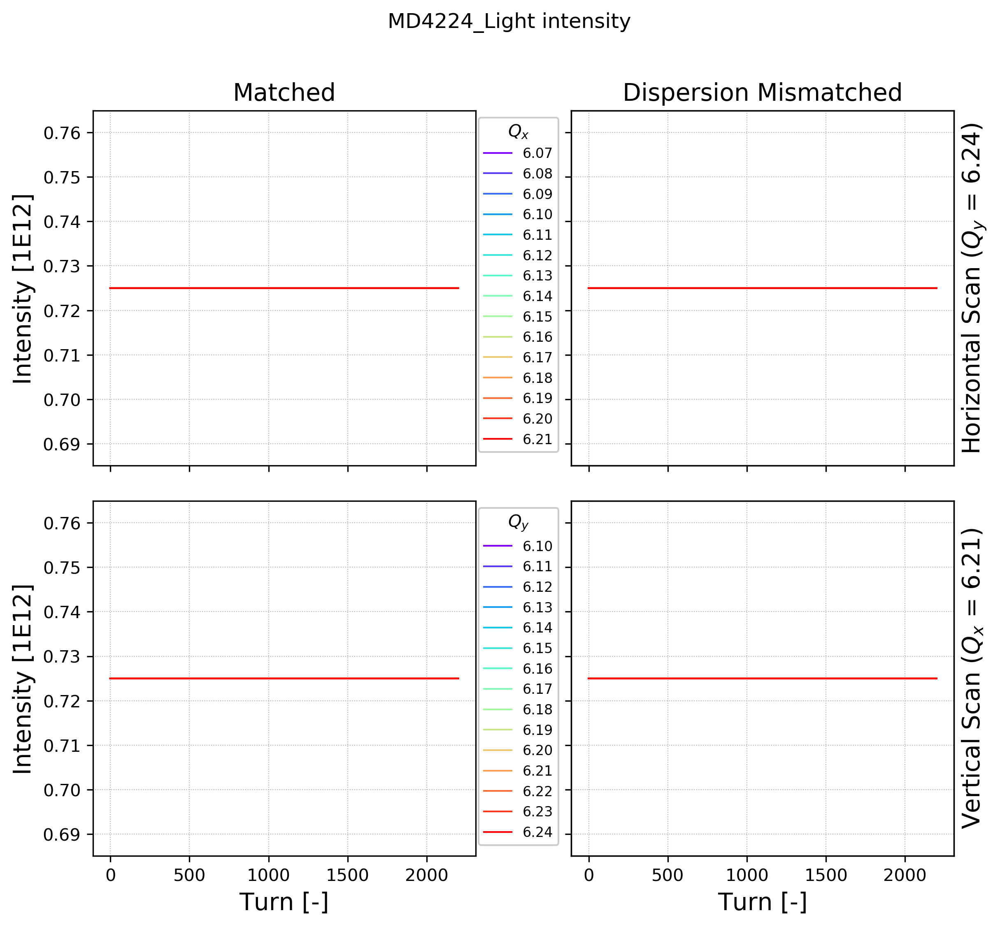

In [10]:
parameter = 'intensity'
multi1 = 1E-12

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace': 0.1, 'wspace': 0.25})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel('Intensity [1E12]');
ax3.set_ylabel('Intensity [1E12]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
        ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
        ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;        

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
        ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
        ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.set_title(title_2)
ax2.set_title(title_1)
        
ax1.grid(lw=0.5, ls=':');
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));

#ax3.set_ylim(ax1.get_ylim())
ax5 = ax2.twinx()
ax5.set_ylabel(case_label_1);
ax6 = ax4.twinx()
ax6.set_ylabel(case_label_2);
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);

for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

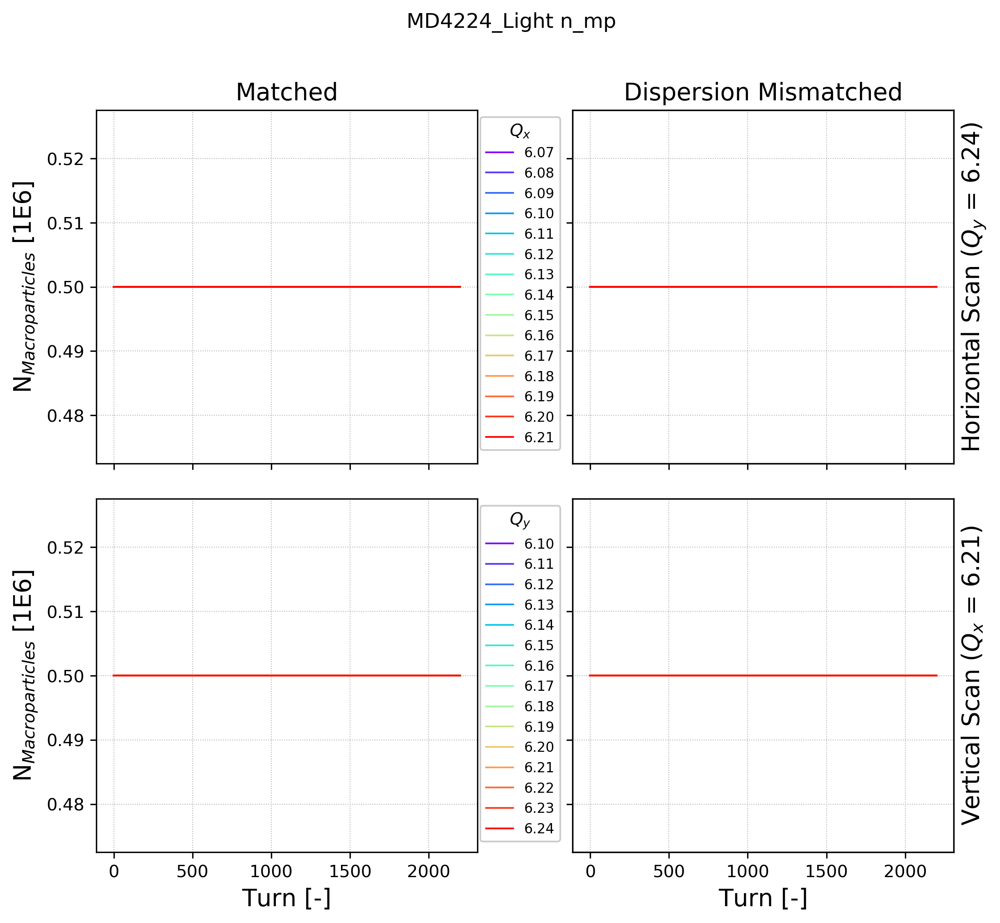

In [11]:
parameter = 'n_mp'
multi1 = 1E-6

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace': 0.1, 'wspace': 0.25})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'N$_{Macroparticles}$ [1E6]');
ax3.set_ylabel(r'N$_{Macroparticles}$ [1E6]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
        ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
        ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;        

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
        ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
        ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.set_title(title_2)
ax2.set_title(title_1)
        
ax1.grid(lw=0.5, ls=':');
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));

#ax3.set_ylim(ax1.get_ylim())
ax5 = ax2.twinx()
ax5.set_ylabel(case_label_1);
ax6 = ax4.twinx()
ax6.set_ylabel(case_label_2);
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);

for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

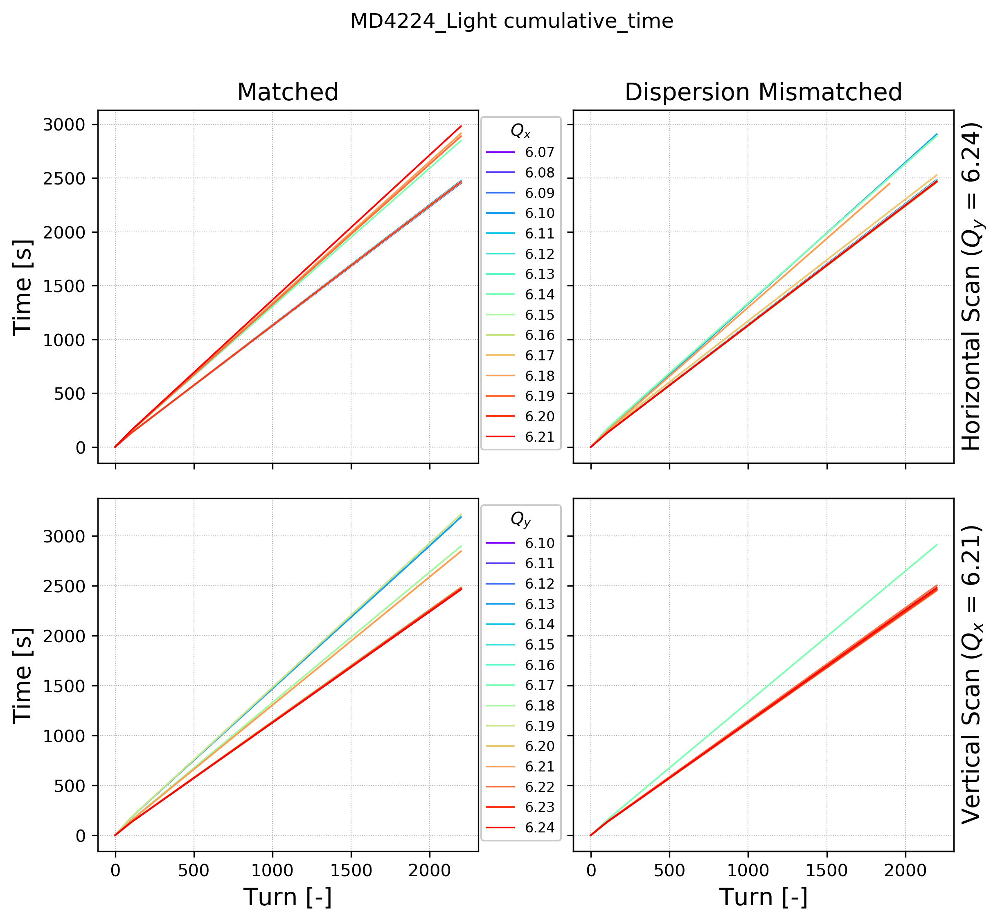

In [12]:
parameter = 'cumulative_time'
multi1 = 1./60.

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace': 0.1, 'wspace': 0.25})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel('Time [s]');
ax3.set_ylabel('Time [s]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
        ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
        ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;        

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
        ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
        ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.set_title(title_2)
ax2.set_title(title_1)
        
ax1.grid(lw=0.5, ls=':');
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));

#ax3.set_ylim(ax1.get_ylim())
ax5 = ax2.twinx()
ax6 = ax4.twinx()
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);

ax5.set_ylabel(case_label_1);
ax6.set_ylabel(case_label_2);

for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

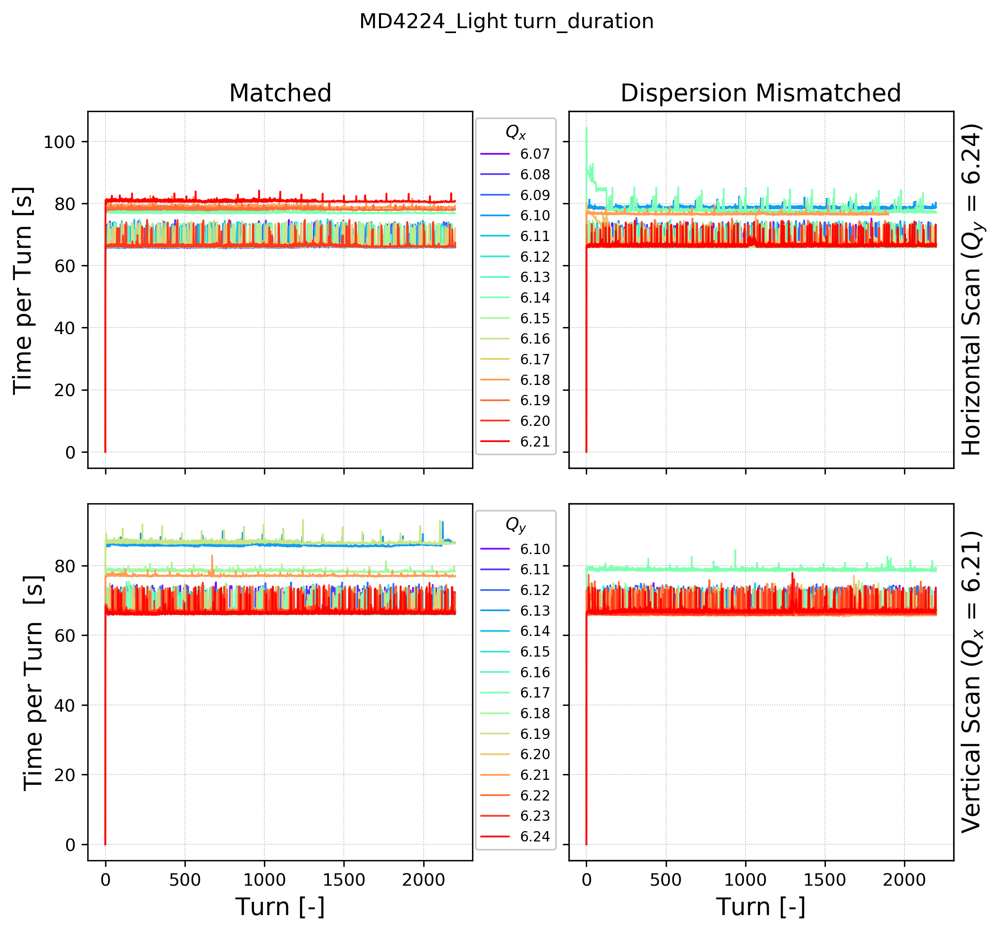

In [13]:
parameter = 'turn_duration'
multi1 = 1

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace': 0.1, 'wspace': 0.25})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel('Time per Turn [s]');
ax3.set_ylabel('Time per Turn  [s]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
        ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
        ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;        

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
        ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
        ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.set_title(title_2)
ax2.set_title(title_1)
        
ax1.grid(lw=0.5, ls=':');
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));

#ax3.set_ylim(ax1.get_ylim())
ax5 = ax2.twinx()
ax6 = ax4.twinx()
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Matched   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_x  =  6.15  range =  2.81  =  45.6 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  sig_x  =  5.57  range =  2.04  =  36.6 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_x  =  5.1  range =  1.3  =  25.4 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  sig_x  =  4.76  range =  0.914  =  19.2 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_x  =  4.53  range =  0.638  =  14.1 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  sig_x  =  4.38  range =  0.493  =  11.2 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_x  =  4.3  range =  0.425  =  9.89 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  sig_x  =  4.25  range =  0.367  =  8.63 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  sig_x  =  4.21  range =  0.314  =  7.46 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.16 Average  sig_x  =  4.2  range =  0.293  =  6.96 %
Matched   Horizon

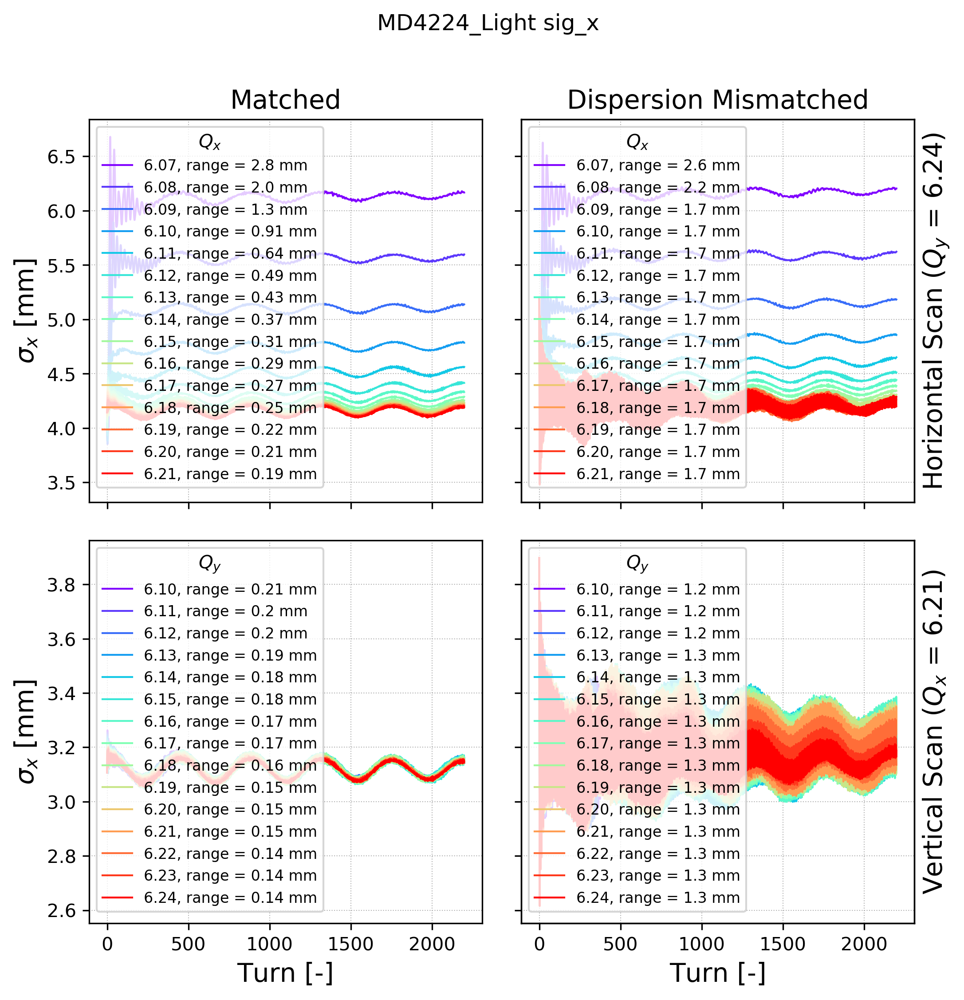

In [14]:
full_labels = True
range_unit = 'mm'
round_sig_limit = 2
parameter = 'sig_x'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\sigma_x$ [mm]');
ax3.set_ylabel(r'$\sigma_x$ [mm]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) +  ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) +  ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()  

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Matched   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_xp  =  0.306  range =  0.198  =  64.8 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  sig_xp  =  0.258  range =  0.124  =  48.1 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_xp  =  0.222  range =  0.0836  =  37.6 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  sig_xp  =  0.195  range =  0.0564  =  28.9 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_xp  =  0.176  range =  0.0373  =  21.1 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  sig_xp  =  0.164  range =  0.0243  =  14.8 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_xp  =  0.155  range =  0.0165  =  10.6 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  sig_xp  =  0.15  range =  0.0121  =  8.08 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  sig_xp  =  0.146  range =  0.0087  =  5.94 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.16 Average  sig_xp  =  0.144  range =  0

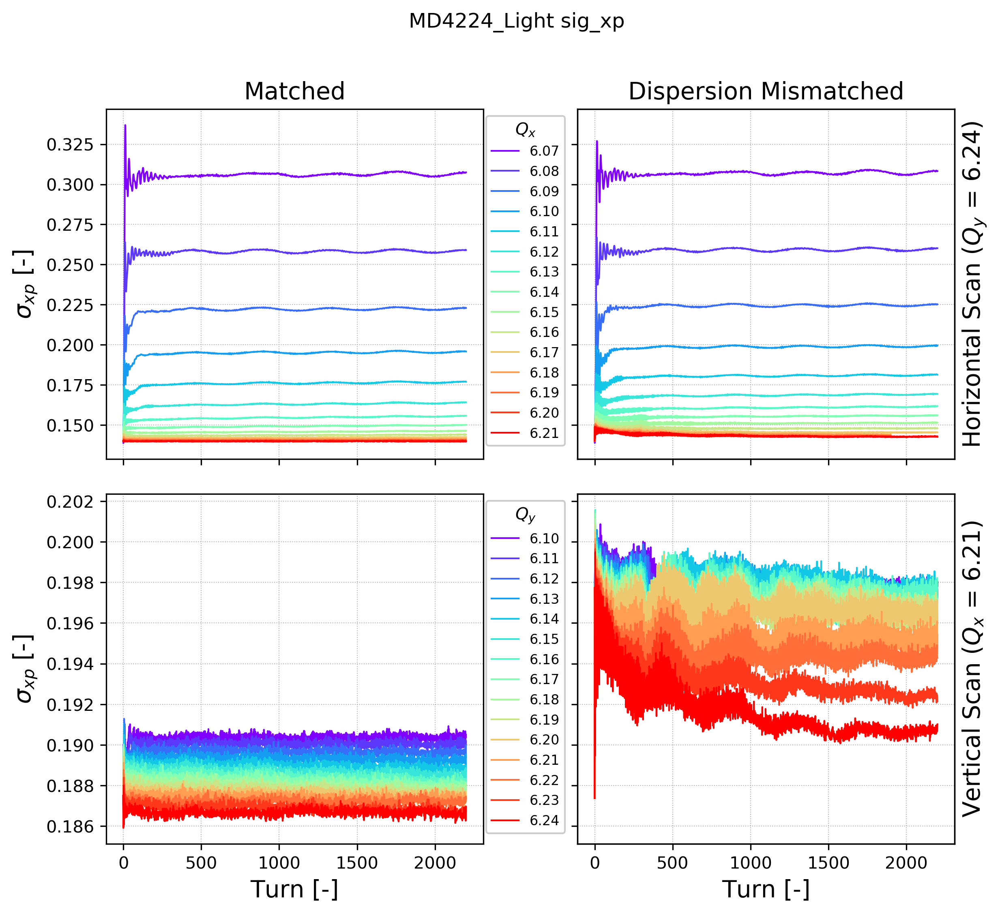

In [15]:
full_labels = False
range_unit = ''
round_sig_limit = 2
parameter = 'sig_xp'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\sigma_{xp}$ [-]');
ax3.set_ylabel(r'$\sigma_{xp}$ [-]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;


ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Matched   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_y  =  2.33  range =  0.0993  =  4.26 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  sig_y  =  2.33  range =  0.0844  =  3.63 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_y  =  2.32  range =  0.0787  =  3.39 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  sig_y  =  2.32  range =  0.0749  =  3.22 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_y  =  2.32  range =  0.0711  =  3.07 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  sig_y  =  2.32  range =  0.0712  =  3.07 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_y  =  2.31  range =  0.0683  =  2.96 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  sig_y  =  2.31  range =  0.0671  =  2.91 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  sig_y  =  2.31  range =  0.0657  =  2.85 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.16 Average  sig_y  =  2.3  range =  0.0641  =  2.78 %
M

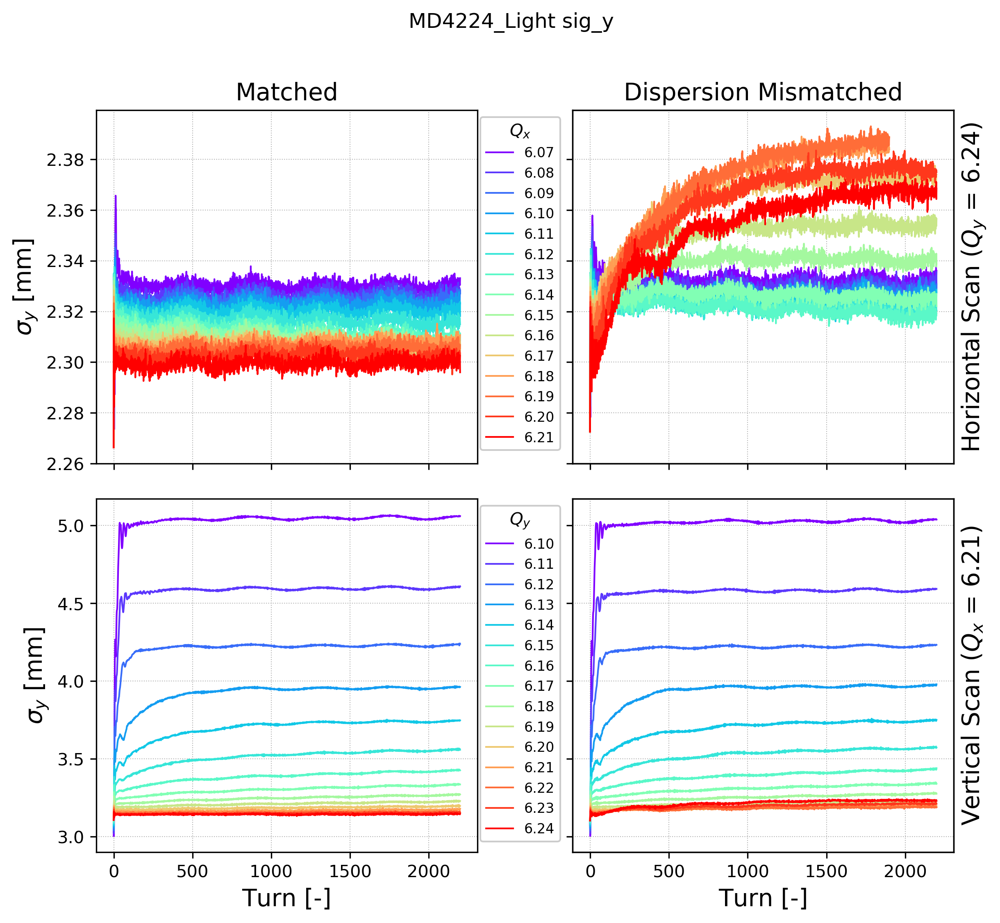

In [16]:
full_labels = False
range_unit = 'mm'
round_sig_limit = 2
parameter = 'sig_y'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\sigma_y$ [mm]');
ax3.set_ylabel(r'$\sigma_y$ [mm]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;


ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Matched   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_yp  =  0.189  range =  0.00765  =  4.06 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  sig_yp  =  0.189  range =  0.00662  =  3.51 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_yp  =  0.189  range =  0.00622  =  3.29 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  sig_yp  =  0.189  range =  0.00593  =  3.14 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_yp  =  0.189  range =  0.00565  =  2.99 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  sig_yp  =  0.189  range =  0.0056  =  2.96 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_yp  =  0.189  range =  0.00536  =  2.84 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  sig_yp  =  0.189  range =  0.00528  =  2.79 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  sig_yp  =  0.189  range =  0.00516  =  2.73 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.16 Average  sig_yp  =  0.19  

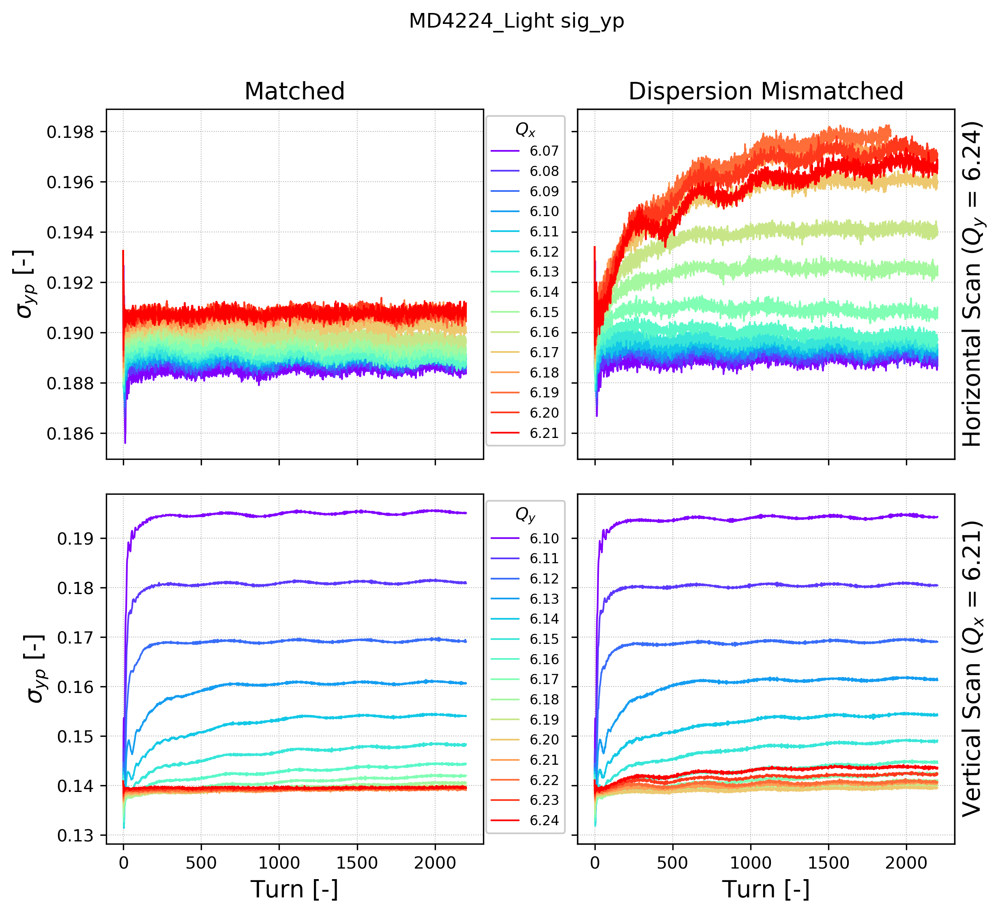

In [17]:
full_labels = False
range_unit = ''
round_sig_limit = 2
parameter = 'sig_yp'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\sigma_{yp}$ [-]');
ax3.set_ylabel(r'$\sigma_{yp}$ [-]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;


ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Matched   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  beta_x  =  18.1  range =  13.2  =  73.0 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  beta_x  =  18.4  range =  9.1  =  49.3 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  beta_x  =  18.7  range =  7.31  =  39.1 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  beta_x  =  19.1  range =  6.27  =  32.9 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  beta_x  =  19.4  range =  5.18  =  26.6 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  beta_x  =  19.9  range =  4.21  =  21.2 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  beta_x  =  20.4  range =  3.34  =  16.4 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  beta_x  =  20.8  range =  2.62  =  12.6 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  beta_x  =  21.1  range =  1.96  =  9.27 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.16 Average  beta_x  =  21.5  range =  1.55  =  7.21 %
Matched   H

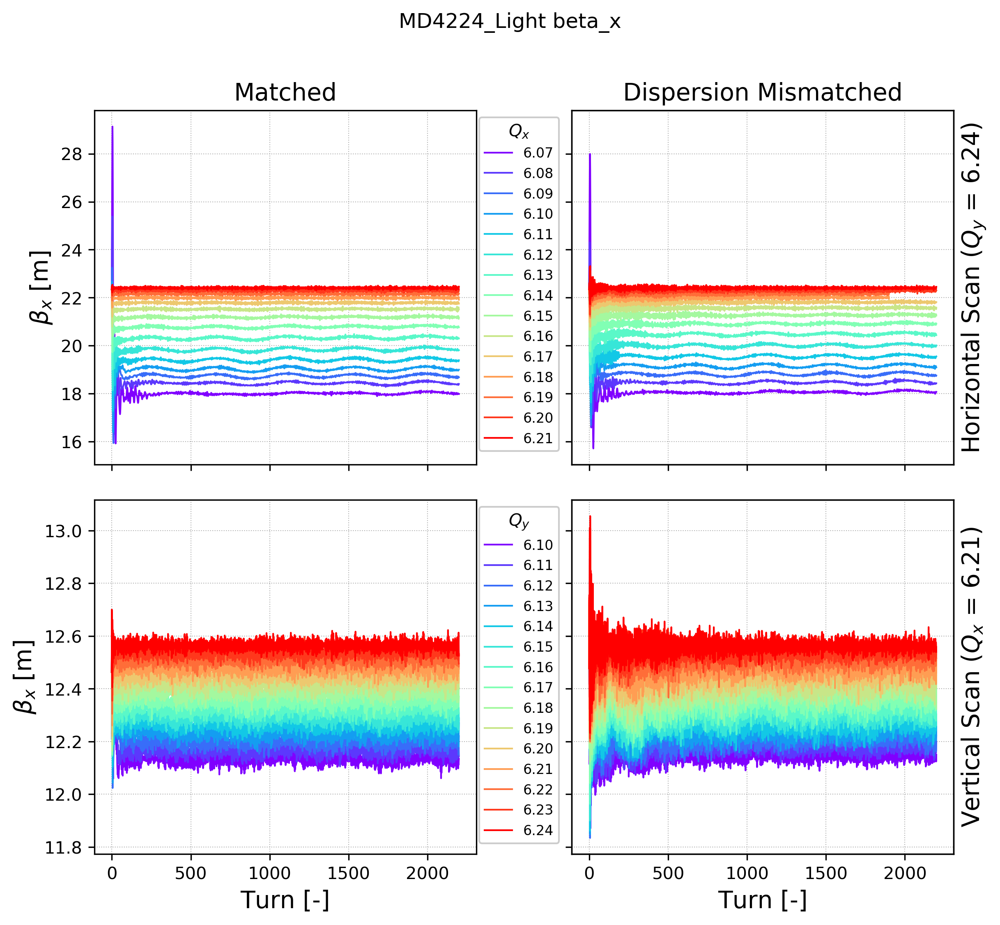

In [18]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'beta_x'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\beta_x$ [m]');
ax3.set_ylabel(r'$\beta_x$ [m]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    
ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Matched   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  beta_y  =  12.4  range =  1.01  =  8.13 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  beta_y  =  12.3  range =  0.856  =  6.94 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  beta_y  =  12.3  range =  0.8  =  6.5 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  beta_y  =  12.3  range =  0.763  =  6.2 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  beta_y  =  12.3  range =  0.726  =  5.92 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  beta_y  =  12.3  range =  0.728  =  5.93 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  beta_y  =  12.2  range =  0.705  =  5.76 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  beta_y  =  12.2  range =  0.696  =  5.71 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  beta_y  =  12.2  range =  0.682  =  5.59 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.16 Average  beta_y  =  12.1  range =  0.665  =  5.47 %
Match

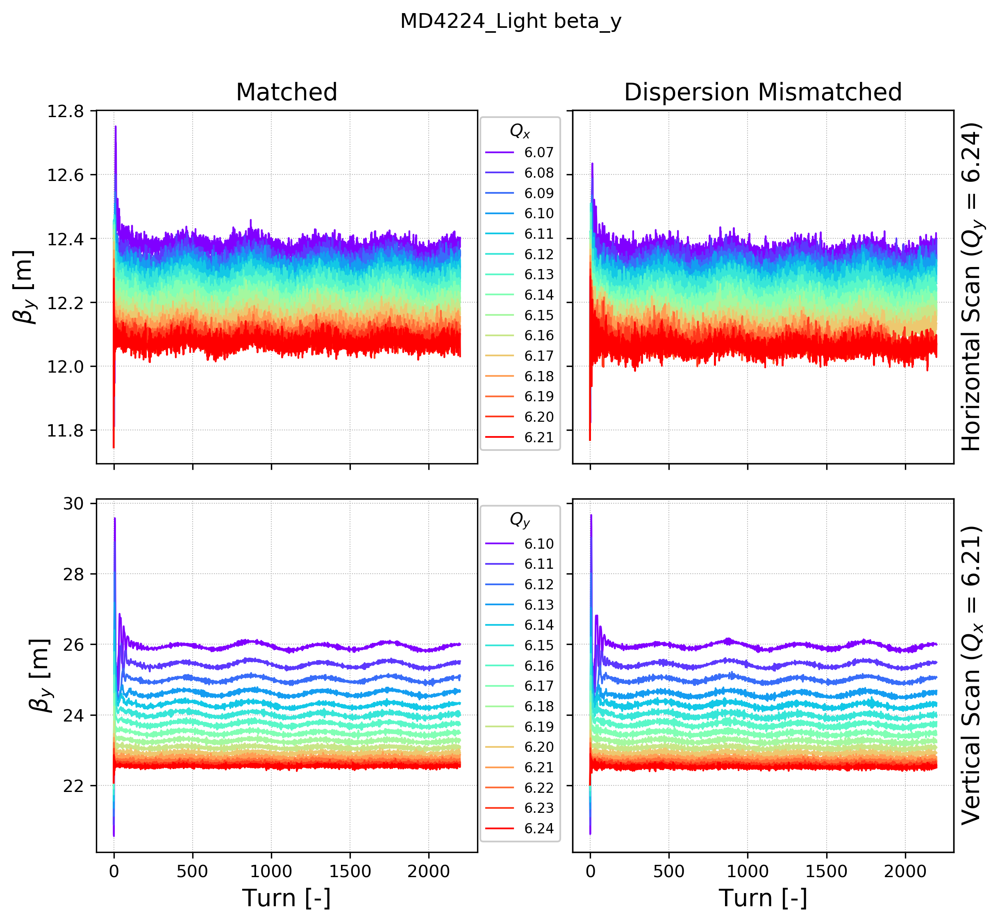

In [19]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'beta_y'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\beta_y$ [m]');
ax3.set_ylabel(r'$\beta_y$ [m]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Matched   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  D_x  =  3.86  range =  4.11  =  107.0 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  D_x  =  3.78  range =  2.63  =  69.5 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  D_x  =  3.69  range =  1.81  =  49.0 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  D_x  =  3.62  range =  1.38  =  38.3 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  D_x  =  3.57  range =  1.16  =  32.6 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  D_x  =  3.51  range =  0.983  =  28.0 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  D_x  =  3.46  range =  0.835  =  24.1 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  D_x  =  3.43  range =  0.712  =  20.8 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  D_x  =  3.39  range =  0.617  =  18.2 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.16 Average  D_x  =  3.36  range =  0.5  =  14.9 %
Matched   Horizontal Scan ($Q_y$ = 6

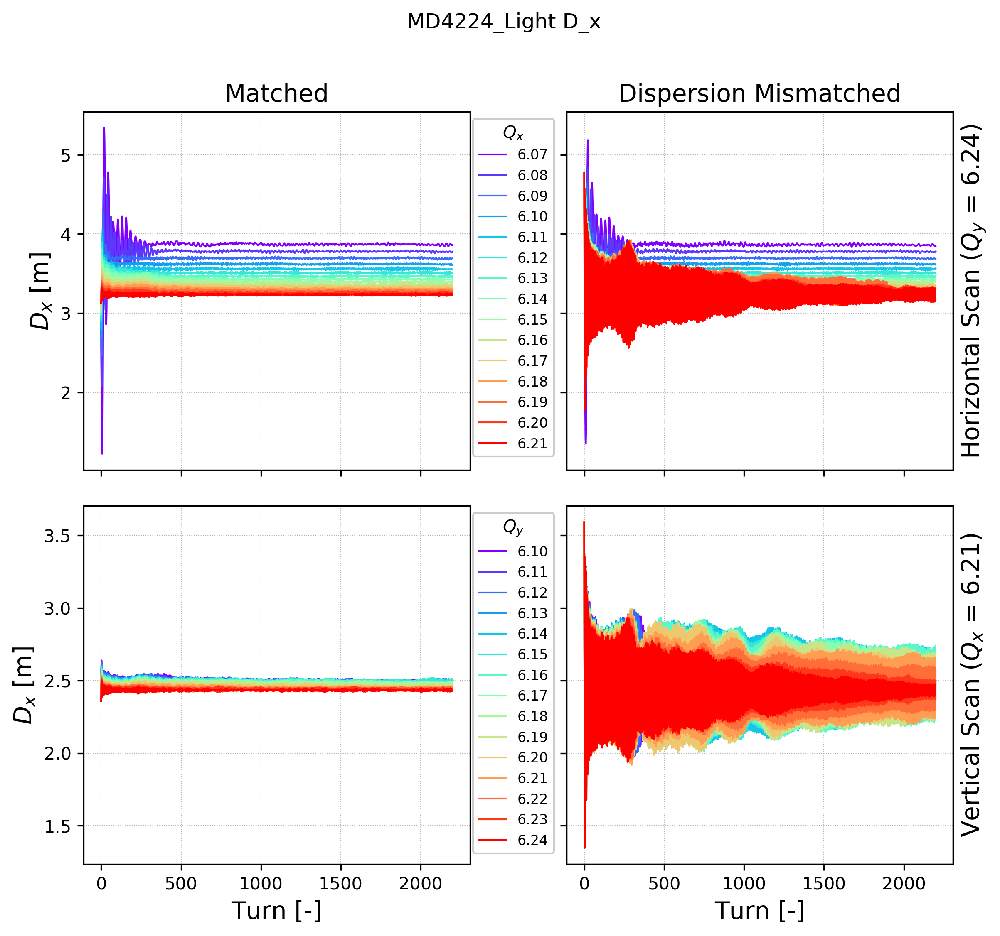

In [20]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'D_x'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$D_x$ [m]');
ax3.set_ylabel(r'$D_x$ [m]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Matched   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  D_y  =  0.00158  range =  0.0273  =  1730.0 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  D_y  =  0.00468  range =  0.0326  =  698.0 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  D_y  =  0.00601  range =  0.0295  =  491.0 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  D_y  =  7.66e-05  range =  0.0226  =  29500.0 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  D_y  =  -0.00455  range =  0.0268  =  -589.0 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  D_y  =  -0.00271  range =  0.0255  =  -943.0 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  D_y  =  0.00102  range =  0.0233  =  2290.0 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  D_y  =  0.00118  range =  0.0222  =  1880.0 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  D_y  =  0.00139  range =  0.0312  =  2240.0 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.16 Average  D_y  =  0.0010

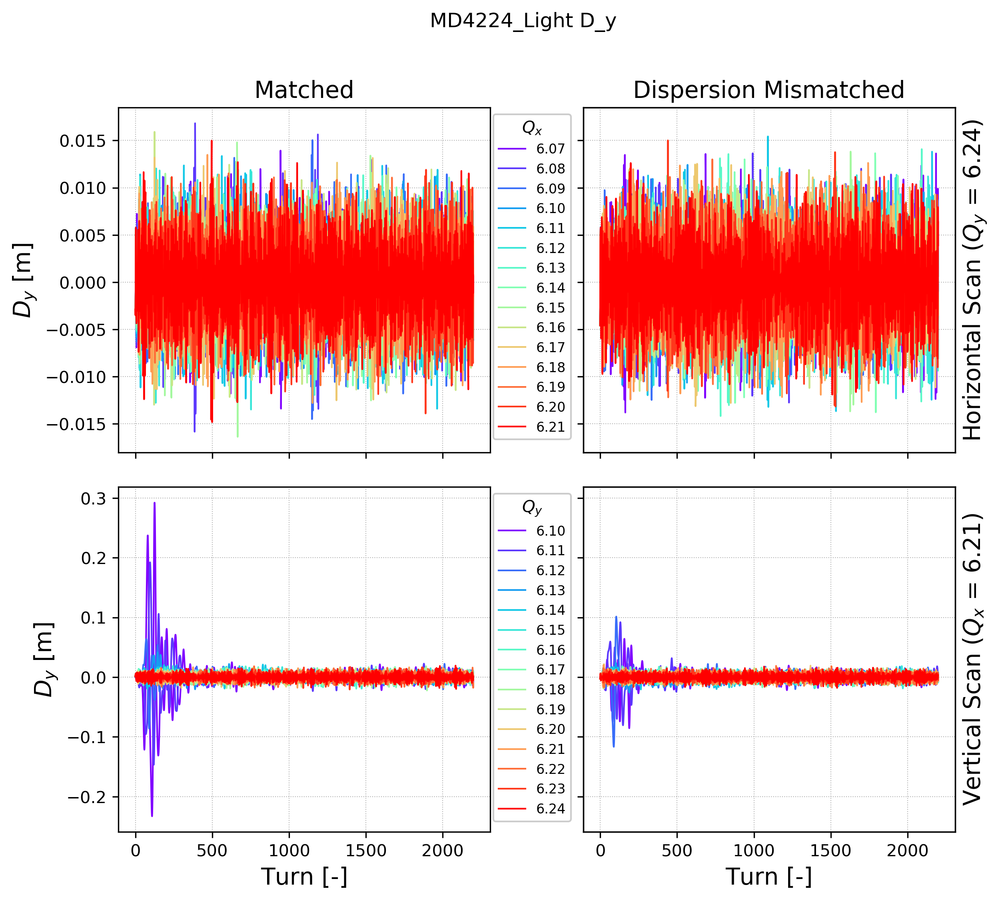

In [21]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'D_y'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$D_y$ [m]');
ax3.set_ylabel(r'$D_y$ [m]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Matched   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  dpp_rms  =  0.848  range =  0.0515  =  6.07 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  dpp_rms  =  0.847  range =  0.0522  =  6.16 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  dpp_rms  =  0.847  range =  0.053  =  6.25 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  dpp_rms  =  0.847  range =  0.0536  =  6.32 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  dpp_rms  =  0.847  range =  0.054  =  6.38 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  dpp_rms  =  0.847  range =  0.0544  =  6.43 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  dpp_rms  =  0.847  range =  0.0548  =  6.47 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  dpp_rms  =  0.847  range =  0.0551  =  6.51 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  dpp_rms  =  0.847  range =  0.0554  =  6.54 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.16 Average  dpp_rms  =  0.847 

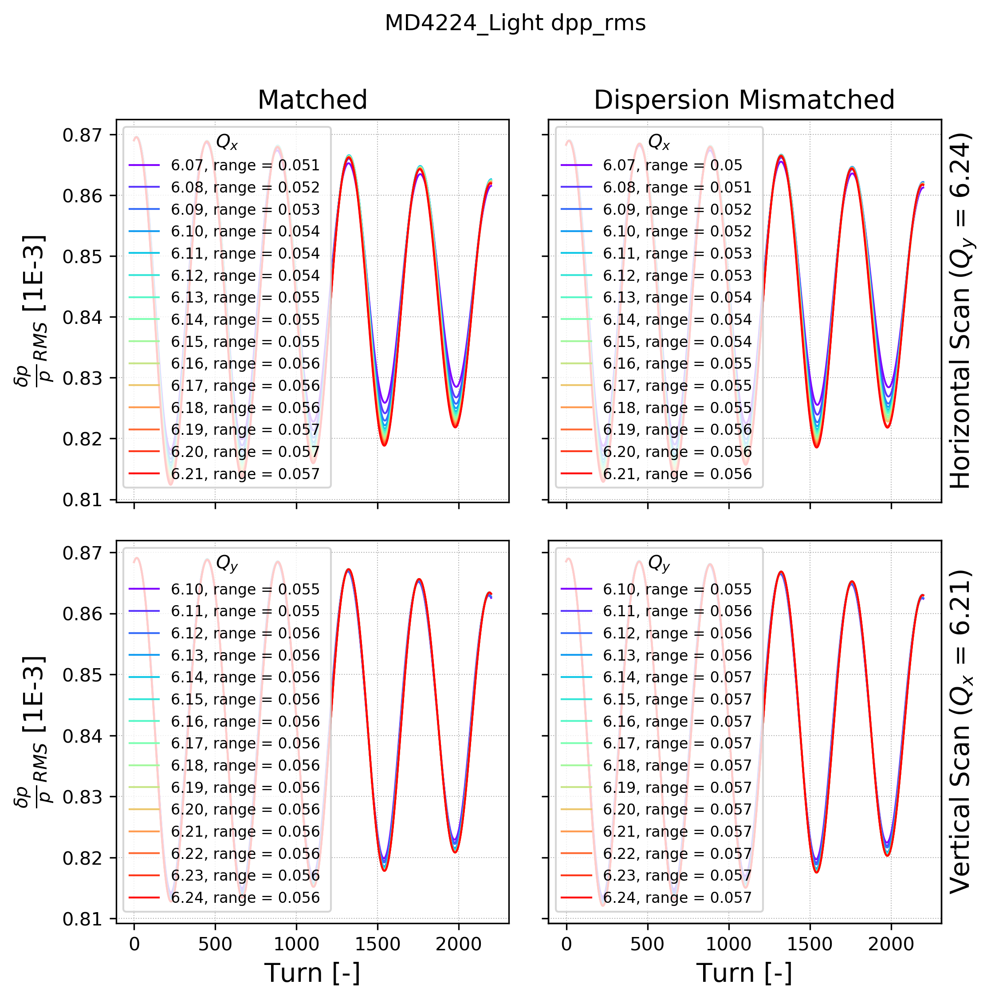

In [22]:
full_labels = True
range_unit = ''
round_sig_limit = 2
parameter = 'dpp_rms'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\frac{\delta p}{p}_{RMS}$ [1E-3]');
ax3.set_ylabel(r'$\frac{\delta p}{p}_{RMS}$ [1E-3]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Matched   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  bunchlength  =  138.0  range =  8.36  =  6.06 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  bunchlength  =  138.0  range =  8.54  =  6.19 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  bunchlength  =  138.0  range =  8.7  =  6.3 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  bunchlength  =  138.0  range =  8.81  =  6.38 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  bunchlength  =  138.0  range =  8.9  =  6.44 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  bunchlength  =  138.0  range =  8.98  =  6.49 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  bunchlength  =  138.0  range =  9.04  =  6.54 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  bunchlength  =  138.0  range =  9.1  =  6.58 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  bunchlength  =  138.0  range =  9.15  =  6.62 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.16 Average  bu

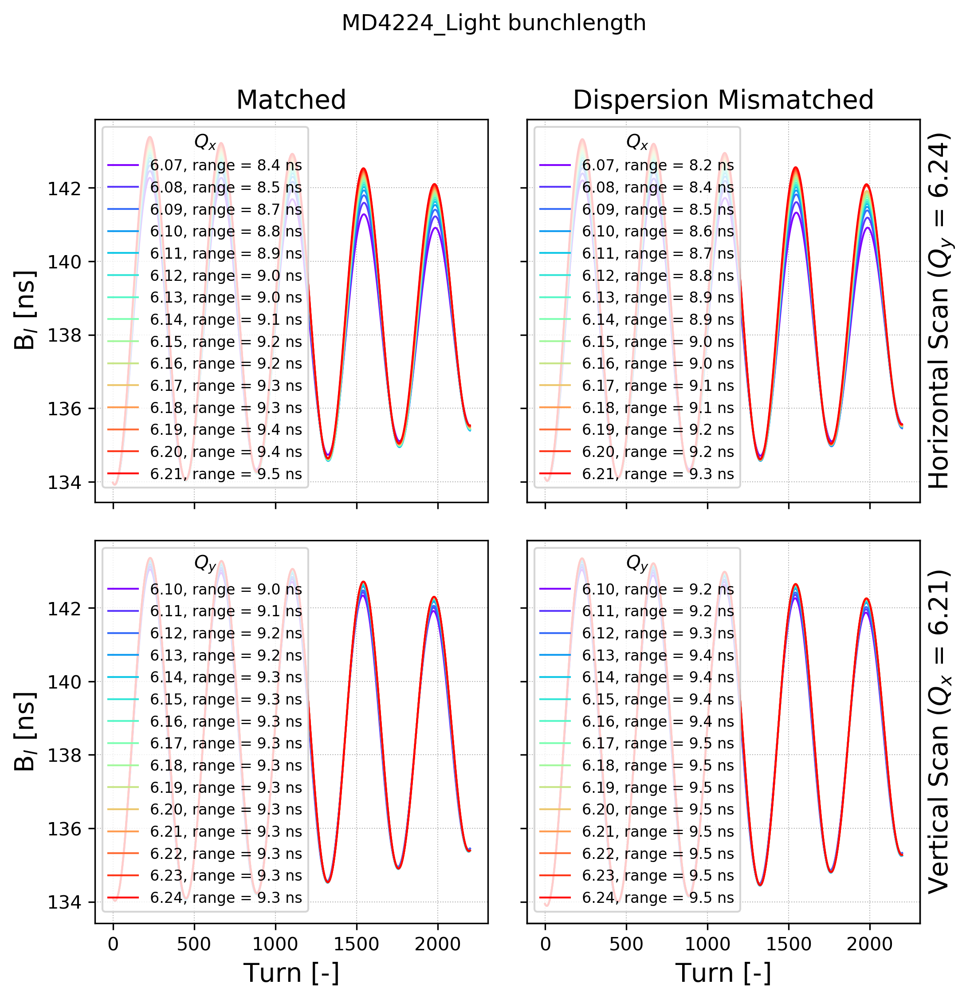

In [23]:
full_labels = True
range_unit = 'ns'
round_sig_limit = 2
parameter = 'bunchlength'
multi1 = 1E9

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'B$_l$ [ns]');
ax3.set_ylabel(r'B$_l$ [ns]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Matched   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_z  =  9.47  range =  0.574  =  6.06 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  sig_z  =  9.48  range =  0.586  =  6.19 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_z  =  9.48  range =  0.597  =  6.3 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  sig_z  =  9.48  range =  0.605  =  6.38 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_z  =  9.48  range =  0.611  =  6.44 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  sig_z  =  9.49  range =  0.616  =  6.49 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_z  =  9.49  range =  0.62  =  6.54 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  sig_z  =  9.49  range =  0.624  =  6.58 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  sig_z  =  9.49  range =  0.628  =  6.62 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.16 Average  sig_z  =  9.49  range =  0.632  =  6.66 %
Matched   Ho

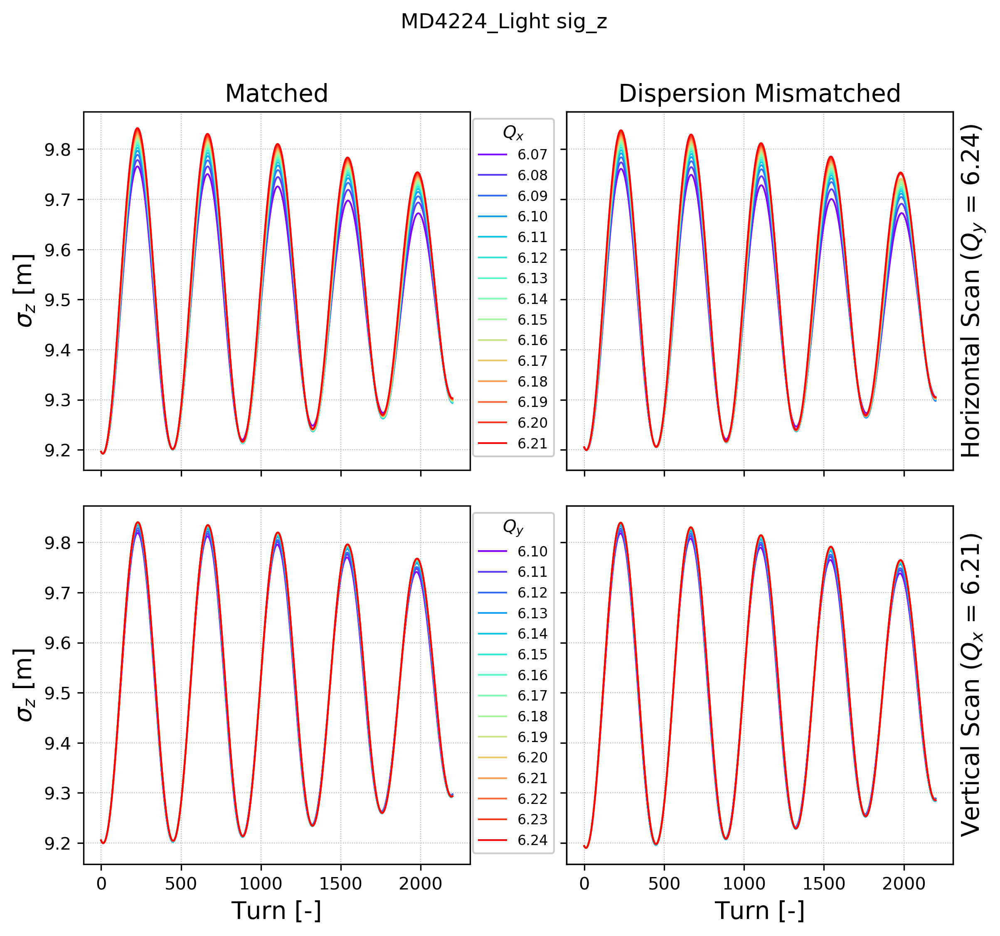

In [24]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'sig_z'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)
ax1.set_ylabel(r'$\sigma_z$ [m]');
ax3.set_ylabel(r'$\sigma_z$ [m]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Matched   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_dE  =  1.66  range =  0.101  =  6.07 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  sig_dE  =  1.66  range =  0.102  =  6.16 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_dE  =  1.66  range =  0.104  =  6.25 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  sig_dE  =  1.66  range =  0.105  =  6.32 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_dE  =  1.66  range =  0.106  =  6.38 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  sig_dE  =  1.66  range =  0.107  =  6.43 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_dE  =  1.66  range =  0.107  =  6.47 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  sig_dE  =  1.66  range =  0.108  =  6.51 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  sig_dE  =  1.66  range =  0.109  =  6.54 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.16 Average  sig_dE  =  1.66  range =  0.109  =  6.58 %


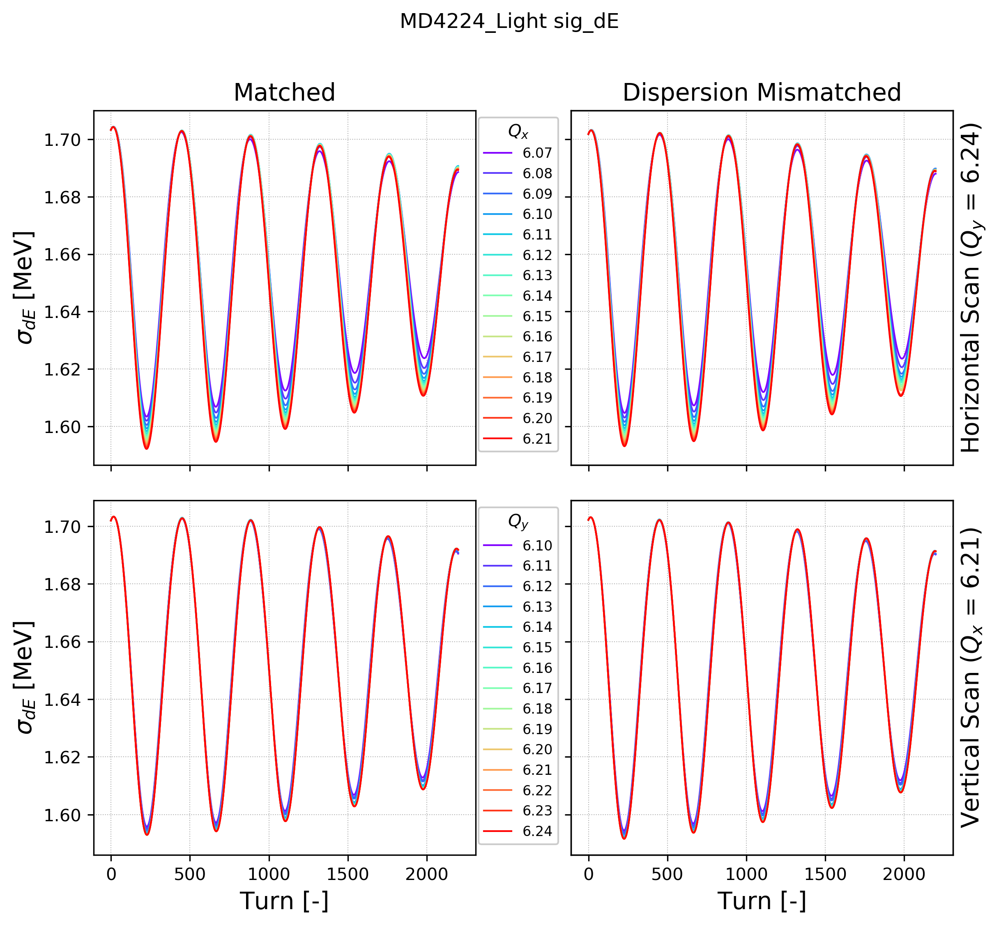

In [25]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'sig_dE'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)
ax1.set_ylabel(r'$\sigma_{dE}$ [MeV]');
ax3.set_ylabel(r'$\sigma_{dE}$ [MeV]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Matched   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  eps_z  =  0.72  range =  0.00298  =  0.414 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  eps_z  =  0.72  range =  0.00292  =  0.405 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  eps_z  =  0.72  range =  0.00303  =  0.421 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  eps_z  =  0.72  range =  0.00307  =  0.426 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  eps_z  =  0.72  range =  0.0031  =  0.431 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  eps_z  =  0.72  range =  0.00314  =  0.436 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  eps_z  =  0.72  range =  0.00316  =  0.439 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  eps_z  =  0.72  range =  0.00318  =  0.441 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  eps_z  =  0.72  range =  0.00319  =  0.444 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.16 Average  eps_z  =  0.72  range =  0

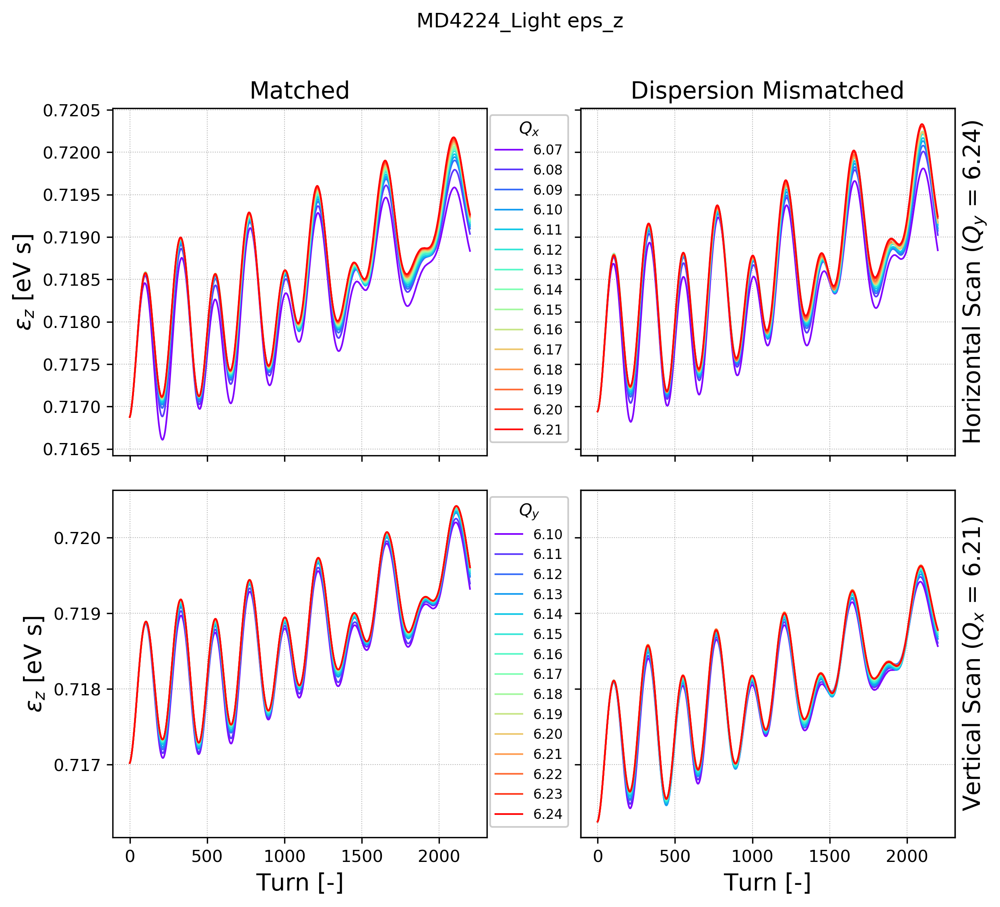

In [26]:
full_labels = False
range_unit = 'eV s'
round_sig_limit = 2
parameter = 'eps_z'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)
ax1.set_ylabel(r'$\epsilon_z$ [eV s]');
ax3.set_ylabel(r'$\epsilon_z$ [eV s]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Matched   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  epsn_x  =  3.42  range =  2.42  =  70.9 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  epsn_x  =  2.57  range =  1.57  =  61.2 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  epsn_x  =  1.98  range =  0.988  =  49.8 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  epsn_x  =  1.59  range =  0.589  =  37.2 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  epsn_x  =  1.34  range =  0.345  =  25.7 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  epsn_x  =  1.19  range =  0.195  =  16.3 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  epsn_x  =  1.11  range =  0.111  =  9.99 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  epsn_x  =  1.06  range =  0.0596  =  5.64 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  epsn_x  =  1.03  range =  0.031  =  3.01 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.16 Average  epsn_x  =  1.01  range =  0.0163  =  1.6 %
M

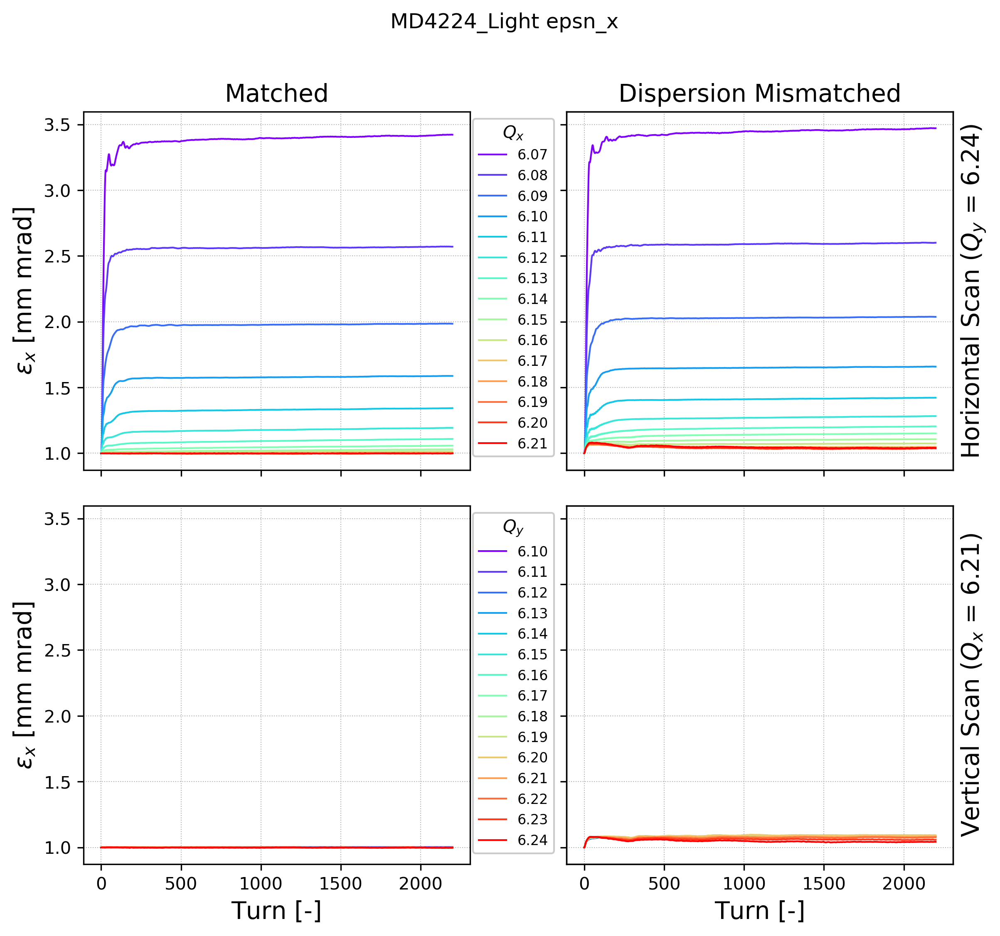

In [27]:
full_labels = False
range_unit = 'mm mrad'
round_sig_limit = 2
parameter = 'epsn_x'
multi1 = 1E6

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)
ax1.set_ylabel(r'$\epsilon_x$ [mm mrad]');
ax3.set_ylabel(r'$\epsilon_x$ [mm mrad]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Matched   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  epsn_y  =  1.0  range =  0.00376  =  0.376 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  epsn_y  =  1.0  range =  0.00332  =  0.332 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  epsn_y  =  1.0  range =  0.00296  =  0.296 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  epsn_y  =  0.999  range =  0.00256  =  0.256 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  epsn_y  =  0.999  range =  0.0021  =  0.211 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  epsn_y  =  0.996  range =  0.00327  =  0.328 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  epsn_y  =  0.993  range =  0.00612  =  0.616 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  epsn_y  =  0.994  range =  0.00561  =  0.564 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  epsn_y  =  0.995  range =  0.00545  =  0.548 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.16 Average  epsn_y  =  0.9

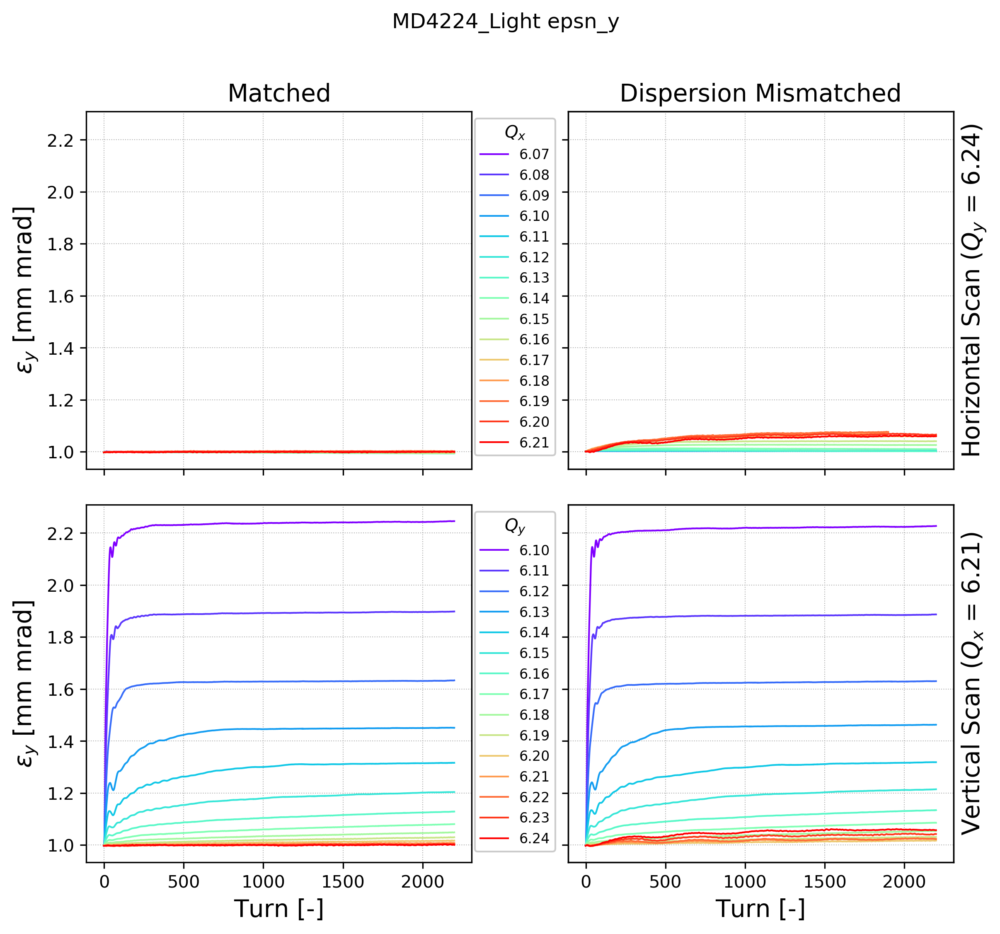

In [28]:
full_labels = False
range_unit = 'mm mrad'
round_sig_limit = 2
parameter = 'epsn_y'
multi1 = 1E6

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)
ax1.set_ylabel(r'$\epsilon_y$ [mm mrad]');
ax3.set_ylabel(r'$\epsilon_y$ [mm mrad]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax1.set_ylim(ax3.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Matched   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  epsn_y  =  2.21  range =  1.21  =  54.9 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  epsn_y  =  1.79  range =  0.788  =  44.1 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  epsn_y  =  1.49  range =  0.495  =  33.2 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  epsn_y  =  1.29  range =  0.296  =  22.9 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  epsn_y  =  1.17  range =  0.173  =  14.8 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  epsn_y  =  1.09  range =  0.0967  =  8.84 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  epsn_y  =  1.05  range =  0.0532  =  5.07 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  epsn_y  =  1.03  range =  0.0281  =  2.74 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  epsn_y  =  1.01  range =  0.0142  =  1.41 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.16 Average  epsn_y  =  1.0  range =  0.00714  =  0.7

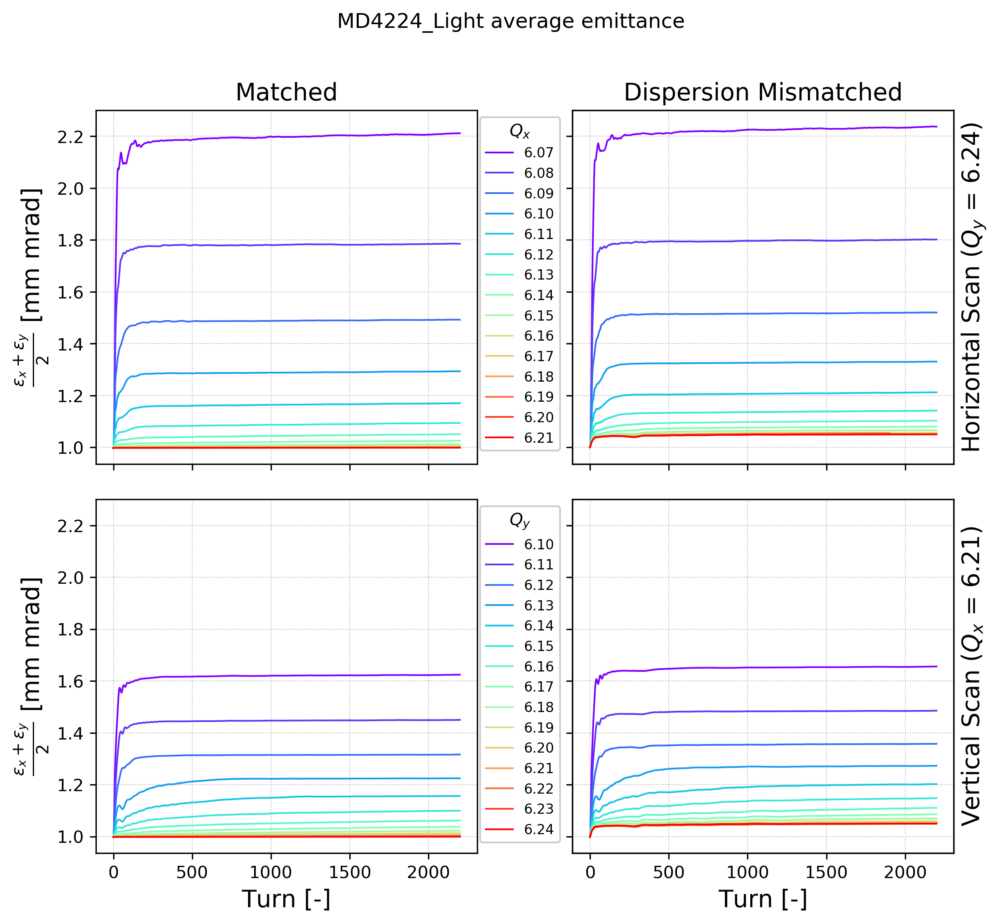

In [29]:
full_labels = False
range_unit = 'mm mrad'
round_sig_limit = 2

parameter1 = 'epsn_x'
multi1 = 1E6
parameter2 = 'epsn_y'
multi2 = 1E6

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' average emittance'

fig.suptitle(tit)

ax1.set_ylabel(r'$\frac{\epsilon_x + \epsilon_y}{2}$ [mm mrad]');
ax3.set_ylabel(r'$\frac{\epsilon_x + \epsilon_y}{2}$ [mm mrad]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    x = np.array(dd1[key]['turn'][0])
    y = np.array((dd1[key][parameter1][0]*multi1 + dd1[key][parameter2][0]*multi2)/2)
    av_ = np.mean(y[-100])
    rang_ = np.abs(np.max(y) - np.min(y))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(x, y, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
      

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    x = np.array(dd2[key]['turn'][0])
    y = np.array((dd2[key][parameter1][0]*multi1 + dd2[key][parameter2][0]*multi2)/2)
    av_ = np.mean(y[-100])
    rang_ = np.abs(np.max(y) - np.min(y))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(x, y, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
 
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    x = np.array(dd3[key]['turn'][0])
    y = np.array((dd3[key][parameter1][0]*multi1 + dd3[key][parameter2][0]*multi2)/2)
    av_ = np.mean(y[-100])
    rang_ = np.abs(np.max(y) - np.min(y))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(x, y, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    x = np.array(dd4[key]['turn'][0])
    y = np.array((dd4[key][parameter1][0]*multi1 + dd4[key][parameter2][0]*multi2)/2)
    av_ = np.mean(y[-100])
    rang_ = np.abs(np.max(y) - np.min(y))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(x, y, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_average_emittance.png'
plt.savefig(savename); 

Matched   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  epsn_x  =  3.42  range =  2.42  =  70.9 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  epsn_x  =  2.57  range =  1.57  =  61.2 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  epsn_x  =  1.98  range =  0.988  =  49.8 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  epsn_x  =  1.59  range =  0.589  =  37.2 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  epsn_x  =  1.34  range =  0.345  =  25.7 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  epsn_x  =  1.19  range =  0.195  =  16.3 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  epsn_x  =  1.11  range =  0.111  =  9.99 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  epsn_x  =  1.06  range =  0.0596  =  5.64 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  epsn_x  =  1.03  range =  0.031  =  3.01 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.16 Average  epsn_x  =  1.01  range =  0.0163  =  1.6 %
M

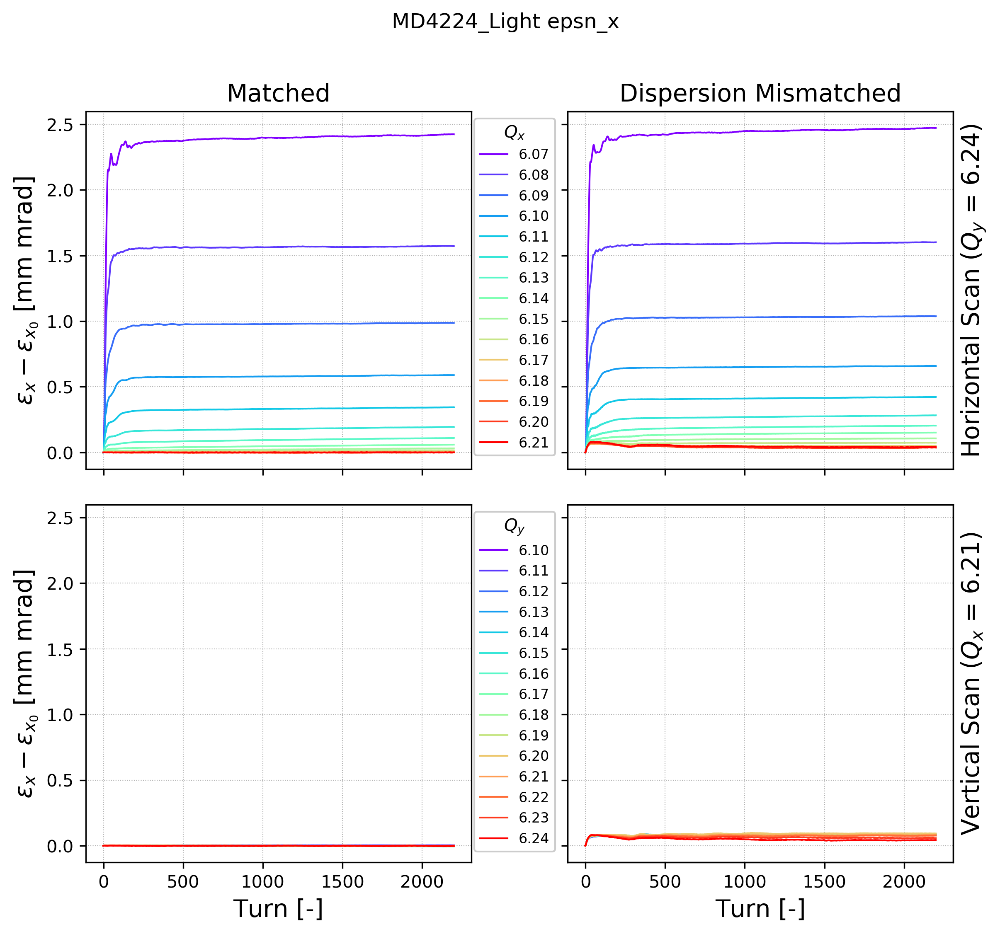

In [30]:
parameter = 'epsn_x'
multi1 = 1E6

plt.rcParams['figure.figsize'] = [9.0, 8.0]
hspace = 0.1
vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\epsilon_x-\epsilon_{x_0}$ [mm mrad]');
ax3.set_ylabel(r'$\epsilon_x-\epsilon_{x_0}$ [mm mrad]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');


colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
        ax1.plot(dd1[key]['turn'][0], ((dd1[key][parameter][0]*multi1)-(dd1[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
        print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
        c_it = c_it + 1;       

ax1.grid(lw=0.5, ls=':');

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
        ax2.plot(dd2[key]['turn'][0], ((dd2[key][parameter][0]*multi1)-(dd2[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);  
        av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
        print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'        
        c_it = c_it + 1;        
ax2.grid(lw=0.5, ls=':');
ax2.set_title(title_1)

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
        ax3.plot(dd3[key]['turn'][0], ((dd3[key][parameter][0]*multi1)-(dd3[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
        print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'        
        c_it = c_it + 1;
ax3.grid(lw=0.5, ls=':');
ax1.set_title(title_2)

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
        ax4.plot(dd4[key]['turn'][0], ((dd4[key][parameter][0]*multi1)-(dd4[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
        print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'        
        c_it = c_it + 1;
ax4.grid(lw=0.5, ls=':');

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax5.set_ylabel(case_label_1);
ax6 = ax4.twinx()
ax6.set_ylabel(case_label_2);
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);


for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '_growth_cf.png'
plt.savefig(savename, dpi = 800);

Matched   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  epsn_y  =  1.0  range =  0.00376  =  0.376 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  epsn_y  =  1.0  range =  0.00332  =  0.332 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  epsn_y  =  1.0  range =  0.00296  =  0.296 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  epsn_y  =  0.999  range =  0.00256  =  0.256 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  epsn_y  =  0.999  range =  0.0021  =  0.211 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  epsn_y  =  0.996  range =  0.00327  =  0.328 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  epsn_y  =  0.993  range =  0.00612  =  0.616 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  epsn_y  =  0.994  range =  0.00561  =  0.564 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  epsn_y  =  0.995  range =  0.00545  =  0.548 %
Matched   Horizontal Scan ($Q_y$ = 6.24)   6.16 Average  epsn_y  =  0.9

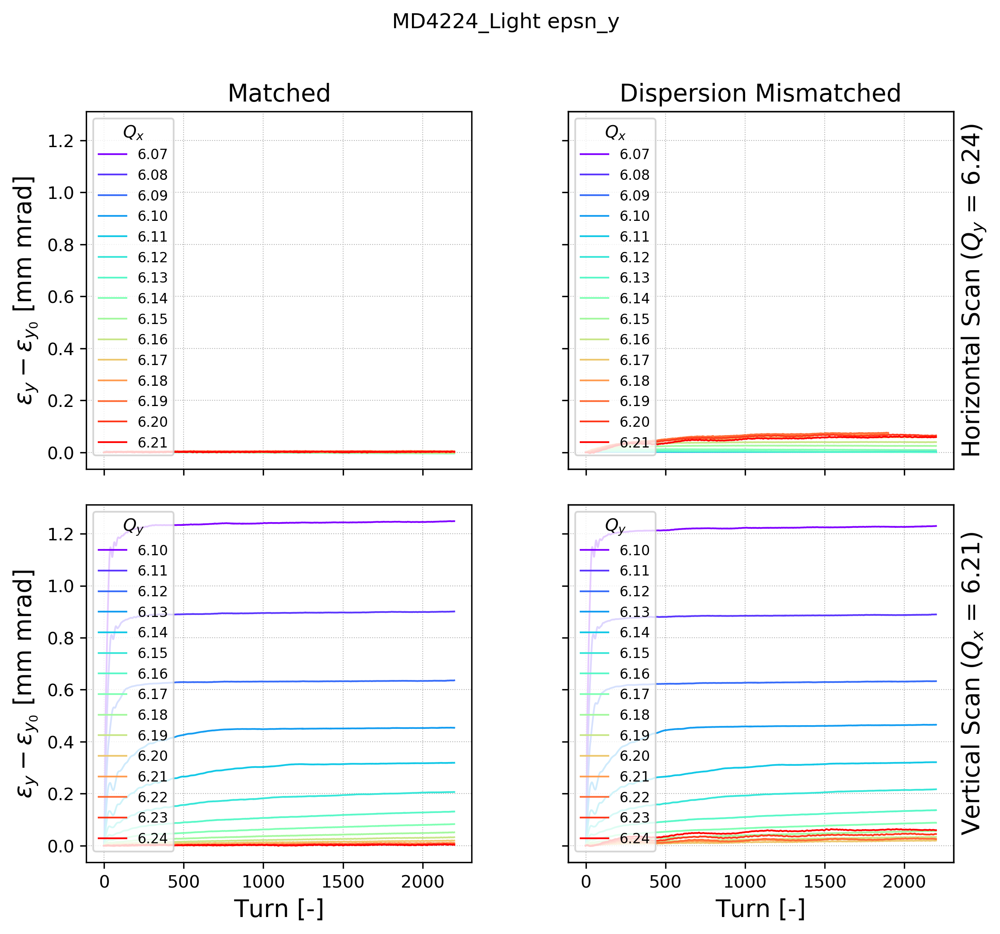

In [31]:
full_labels = True
range_unit = 'mm mrad'
round_sig_limit = 2

parameter = 'epsn_y'
multi1 = 1E6

plt.rcParams['figure.figsize'] = [9.0, 8.0]
hspace = 0.1
vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\epsilon_y-\epsilon_{y_0}$ [mm mrad]');
ax3.set_ylabel(r'$\epsilon_y-\epsilon_{y_0}$ [mm mrad]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');


colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
        ax1.plot(dd1[key]['turn'][0], ((dd1[key][parameter][0]*multi1)-(dd1[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
        print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
        c_it = c_it + 1;       

ax1.grid(lw=0.5, ls=':');

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
        ax2.plot(dd2[key]['turn'][0], ((dd2[key][parameter][0]*multi1)-(dd2[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);  
        av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
        print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'        
        c_it = c_it + 1;        
ax2.grid(lw=0.5, ls=':');
ax2.set_title(title_1)

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
        ax3.plot(dd3[key]['turn'][0], ((dd3[key][parameter][0]*multi1)-(dd3[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
        print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'        
        c_it = c_it + 1;
ax3.grid(lw=0.5, ls=':');
ax1.set_title(title_2)

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
        ax4.plot(dd4[key]['turn'][0], ((dd4[key][parameter][0]*multi1)-(dd4[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
        print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'        
        c_it = c_it + 1;
ax4.grid(lw=0.5, ls=':');

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.set_ylim(ax3.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax5.set_ylabel(case_label_1);
ax6 = ax4.twinx()
ax6.set_ylabel(case_label_2);
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);


for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '_growth_cf.png'
plt.savefig(savename, dpi = 800);